# Results

# Loop over watersheds and extract metrics for each stream threshold
### Topographical streams

In [85]:
import os
import numpy as np
import geopandas as gpd
from sklearn.metrics import matthews_corrcoef, recall_score, precision_score

def calculate_metrics_for_directory(flowaccPointDir):
    metrics_list = []

    for watershed in os.listdir(flowaccPointDir):
        if watershed.endswith('.shp'):
            pointFile = os.path.join(flowaccPointDir, watershed)
            gdf = gpd.read_file(pointFile)
            gdf['stream_initation_in_ha'] = gdf['VALUE'] / 10000
            
            # Fill NaNs in 'Vattendrag' with a default value (e.g., 0)
            gdf['Vattendrag'] = gdf['DikeVatten'].fillna(0).astype(int)
            gdf['isstream'] = np.where(gdf['Vattendrag'] > 0, 1, 0)

            for i in range(1, 50):  # threshold range
                gdf['predstream'] = np.where(gdf['stream_initation_in_ha'] > i, 1, 0)
                
                # Calculate metrics
                mcc = matthews_corrcoef(gdf['isstream'], gdf['predstream'])
                recall = recall_score(gdf['isstream'], gdf['predstream'])
                precision = precision_score(gdf['isstream'], gdf['predstream'])
                
                # Append the results as a tuple
                metrics_list.append((i, mcc, recall, precision, str(watershed)))

    return metrics_list

# Directories
flowaccPointDirFilled = 'U:/william/projects/culverts/data/hydrological_modeling/flowaccumulation_Points_NILS/filled'
flowaccPointDirBreached = 'U:/william/projects/culverts/data/hydrological_modeling/flowaccumulation_Points_NILS/breached'
flowaccPointDirDeepBreached = 'U:/william/projects/culverts/data/hydrological_modeling/flowaccumulation_Points_NILS/deepbreach'
flowaccPointDirHIN = 'U:/william/projects/culverts/data/hydrological_modeling/flowaccumulation_Points_NILS/HIN'
# Calculating metrics for each directory
mccListFilled = calculate_metrics_for_directory(flowaccPointDirFilled)
mccListBreached = calculate_metrics_for_directory(flowaccPointDirBreached)
mccListDeepBreached = calculate_metrics_for_directory(flowaccPointDirDeepBreached)

c:\Users\wmli0001\Anaconda3\envs\DeepBreach\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\wmli0001\Anaconda3\envs\DeepBreach\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\wmli0001\Anaconda3\envs\DeepBreach\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\wmli0001\Anaconda3\envs\DeepBreach\lib\site-packages

### Find optimal channels

In [118]:
import pandas as pd
mcc_df_deep_breached = pd.DataFrame(mccListDeepBreached, columns=['Iteration', 'MMC', 'recall', 'precision', 'name'])
# Assuming df is your initial DataFrame
df = mcc_df_deep_breached

idx = mcc_df_deep_breached.groupby('name')['MMC'].idxmax()

# Group by 'name' and find the row with the maximum MMC value for each group
max_mcc_df = mcc_df_deep_breached.loc[idx].reset_index(drop=True)
max_mcc_df
# Display the resulting DataFrame and the mean MCC value
#print(max_mcc_df)



,Iteration,MMC,recall,precision,name
0,2,0.499249,1.000000,0.250000,0.shp
1,1,0.147165,0.500000,0.045455,1.shp
2,12,0.426897,0.428571,0.428571,10.shp
3,1,0.265894,0.500000,0.142857,100.shp
4,5,0.614247,0.454545,0.833333,101.shp
...,...,...,...,...,...
518,2,0.816249,1.000000,0.666667,95.shp
519,32,0.594782,0.800000,0.444444,96.shp
520,7,0.413142,1.000000,0.172414,97.shp
521,19,0.314509,0.200000,0.500000,98.shp


In [100]:
# Assuming mccList and mccList_breached are already defined
mcc_df_filled = pd.DataFrame(mccListFilled, columns=['Iteration', 'MMC', 'recall', 'precision', 'name'])
mcc_df_breached = pd.DataFrame(mccListBreached, columns=['Iteration', 'MMC', 'recall', 'precision', 'name'])
mcc_df_deep_breached = pd.DataFrame(mccListDeepBreached, columns=['Iteration', 'MMC', 'recall', 'precision', 'name'])

In [95]:
mccListDeepBreached

[(1, 0.16096505630891014, 1.0, 0.02631578947368421, '328.shp'),
 (2, 0.2075557220177789, 1.0, 0.043478260869565216, '328.shp'),
 (3, 0.26653582118943, 1.0, 0.07142857142857142, '328.shp'),
 (4, 0.44684045100820313, 1.0, 0.2, '328.shp'),
 (5, 1.0, 1.0, 1.0, '328.shp'),
 (6, 1.0, 1.0, 1.0, '328.shp'),
 (7, 1.0, 1.0, 1.0, '328.shp'),
 (8, 1.0, 1.0, 1.0, '328.shp'),
 (9, 1.0, 1.0, 1.0, '328.shp'),
 (10, 1.0, 1.0, 1.0, '328.shp'),
 (11, 1.0, 1.0, 1.0, '328.shp'),
 (12, 1.0, 1.0, 1.0, '328.shp'),
 (13, 1.0, 1.0, 1.0, '328.shp'),
 (14, 1.0, 1.0, 1.0, '328.shp'),
 (15, 1.0, 1.0, 1.0, '328.shp'),
 (16, 1.0, 1.0, 1.0, '328.shp'),
 (17, 1.0, 1.0, 1.0, '328.shp'),
 (18, 1.0, 1.0, 1.0, '328.shp'),
 (19, 1.0, 1.0, 1.0, '328.shp'),
 (20, 1.0, 1.0, 1.0, '328.shp'),
 (21, 1.0, 1.0, 1.0, '328.shp'),
 (22, 1.0, 1.0, 1.0, '328.shp'),
 (23, 1.0, 1.0, 1.0, '328.shp'),
 (24, 1.0, 1.0, 1.0, '328.shp'),
 (25, 1.0, 1.0, 1.0, '328.shp'),
 (26, 1.0, 1.0, 1.0, '328.shp'),
 (27, 1.0, 1.0, 1.0, '328.shp'),
 (28, 1.0

## HIN

In [ ]:
import os
import numpy as np
import geopandas as gpd
from sklearn.metrics import matthews_corrcoef

def calculate_mcc_for_directory(flowaccPointDir):
    metrics_list = []

    for watershed in os.listdir(flowaccPointDir):
        if watershed.endswith('.shp'):
            pointFile = os.path.join(flowaccPointDir, watershed)
            gdf = gpd.read_file(pointFile)
            gdf['stream_initation_in_ha'] = gdf['VALUE'] #/ 10000
            
            # Fill NaNs in 'Vattendrag' with a default value (e.g., 0)
            gdf['Vattendrag'] = gdf['DikeVatten'].fillna(0).astype(int)
            gdf['isstream'] = np.where(gdf['Vattendrag'] >0, 1, 0)
            

            gdf['predstream'] = np.where(gdf['stream_initation_in_ha'] > 1, 1, 0)
                            # Calculate metrics
            mcc = matthews_corrcoef(gdf['isstream'], gdf['predstream'])
            recall = recall_score(gdf['isstream'], gdf['predstream'])
            precision = precision_score(gdf['isstream'], gdf['predstream'])
            
            # Append the results as a tuple
            metrics_list.append((mcc, recall, precision, str(watershed)))
            mcc = matthews_corrcoef(gdf['isstream'], gdf['predstream'])


    return metrics_list


flowaccPointDirHIN = 'U:/william/projects/culverts/data/hydrological_modeling/flowaccumulation_Points_NILS/HIN'

mccListHIN = calculate_mcc_for_directory(flowaccPointDirHIN)



## Plots

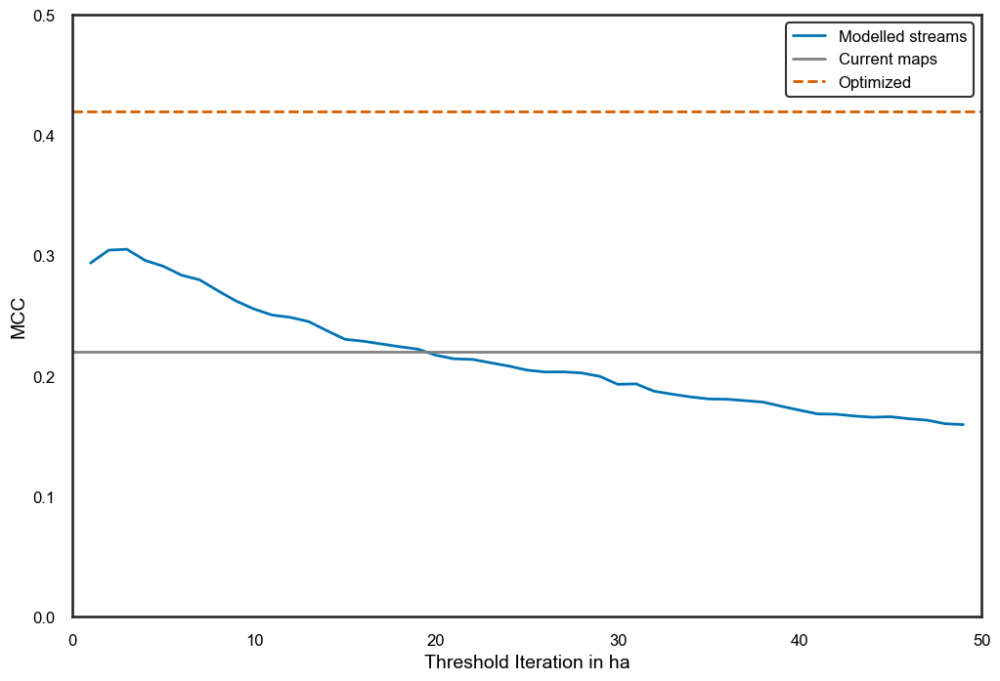

In [185]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming mccListDeepBreached is defined
mcc_df_deep_breached = pd.DataFrame(mccListDeepBreached, columns=['Iteration', 'MCC', 'recall', 'precision', 'name'])

# Set the Seaborn style to "white" to remove the background grid and use a colorblind-friendly palette
sns.set(style="white", context="talk", palette="colorblind")

# Create the figure and axis objects
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the data from the second DataFrame
sns.lineplot(data=mcc_df_deep_breached, x='Iteration', y='MCC', ax=ax, label='Modelled streams', linewidth=2.0, linestyle='-',errorbar=None)
plt.axhline(y=0.22, color='grey',linewidth=2.0, linestyle='-', label='Current maps')  # Blue from the colorblind palette
plt.axhline(y=0.42, color='#D55E00',linewidth=2.0, linestyle='--', label='Optimized')  # Vermilion from the colorblind palette

# Set colors of plot elements for visibility in light mode
plt.xlabel('Threshold Iteration in ha', color='black', fontsize=14)
plt.ylabel('MCC', color='black', fontsize=14)
plt.tick_params(axis='x', colors='black', labelsize=12)  # Change the color of the x-axis ticks
plt.tick_params(axis='y', colors='black', labelsize=12)  # Change the color of the y-axis ticks
plt.xlim(0, 50)
plt.ylim(0, 0.5)

# Set the title of the plot
#plt.title('MCC vs. Threshold Iteration', color='black', fontsize=16)

# Add legend with black text
legend = ax.legend(loc='upper right', fontsize=12, facecolor='white', edgecolor='black')
for text in legend.get_texts():
    text.set_color('black')

plt.savefig('U:/william/projects/culverts/data/figures/NILS.png', dpi=200)
# Show the plot
plt.show()




### Count the number of detected culverts in Sweden

In [193]:
import os
import geopandas as gpd

def count_features_in_shapefiles(directory):
    # List to hold the results
    results = []
    
    # Iterate over all files in the directory
    for filename in os.listdir(directory):
        if filename.endswith(".shp"):
            # Construct full file path
            filepath = os.path.join(directory, filename)
            
            # Read the shapefile
            try:
                shapefile = gpd.read_file(filepath)
                
                # Get the number of features
                num_features = len(shapefile)
                
                # Append to results
                results.append((filename, num_features))
            except Exception as e:
                # In case of an error, append the error message
                results.append((filename, str(e)))
    
    return results

# Directory containing shapefiles
directory_path = 'U:/william/projects/culverts/data/inference/sweden/vector'

# Get the number of features in each shapefile
feature_counts = count_features_in_shapefiles(directory_path)

# Print the results
for filename, count in feature_counts:
    print(f"{filename}: {count} features")


23B028_655_45_0075.shp: 105 features
21G023_72125_6700_25.shp: 24 features
19F013_70225_6375_25.shp: 70 features
19A017_62600_5125_25.shp: 134 features
20A039_63700_5800_25.shp: 118 features
23F054_704_44_5025.shp: 93 features
23F023_704_55_7500.shp: 70 features
21C050_66825_7025_25.shp: 3 features
20C028_65750_6250_25.shp: 135 features
23B028_656_46_0075.shp: 89 features
23F021_704_51_5075.shp: 117 features
18A031_63125_3775_25.shp: 178 features
18H014_73275_7275_25.shp: 28 features
21E007_67700_5925_25.shp: 80 features
23B028_653_43_0075.shp: 1 features
22B004_63825_3825_25.shp: 161 features
19F009_70000_5275_25.shp: 52 features
20B016_64775_3275_25.shp: 208 features
20D017_67000_4325_25.shp: 75 features
19A015_62425_4600_25.shp: 67 features
20D016_67400_4000_25.shp: 53 features
22A038_63725_5600_25.shp: 136 features
22B006_64150_4250_25.shp: 174 features
21H031_74300_7550_25.shp: 24 features
21C030_65600_6900_25.shp: 95 features
19A010_62075_4750_25.shp: 65 features
21C039_66275_677

In [189]:
mcc_df_deep_breached['MCC'].max()

1.0


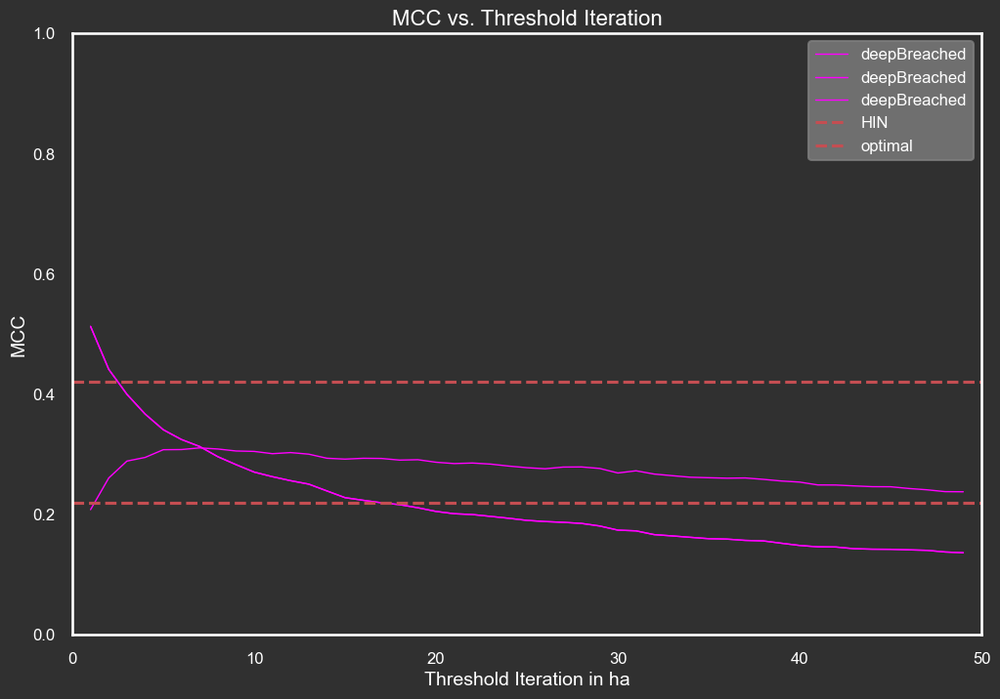

In [136]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming mccList and mccList_breached are already defined
#mcc_df_filled = pd.DataFrame(mccListFilled, columns=['Iteration', 'MMC', 'recall', 'precision', 'name'])
#mcc_df_breached = pd.DataFrame(mccListBreached, columns=['Iteration', 'MMC', 'recall', 'precision', 'name'])
mcc_df_deep_breached = pd.DataFrame(mccListDeepBreached, columns=['Iteration', 'MCC', 'recall', 'precision', 'name'])
# Set the Seaborn style to "dark"
sns.set(style="dark", context="talk")

# Create the figure and axis objects
fig, ax = plt.subplots(figsize=(12, 8))

# Customize the plot and axes backgrounds
fig.patch.set_facecolor('#303030')  # Set the figure background to dark
ax.set_facecolor('#303030')  # Set the axes background to dark

# Plot the data from the first DataFrame
#sns.lineplot(data=mcc_df_filled, x='Iteration', y='MCC', color="cyan", ax=ax, label='Original', linewidth=1.0, linestyle='-',errorbar=None)

# Plot the data from the second DataFrame
#sns.lineplot(data=mcc_df_breached, x='Iteration', y='MCC', color="magenta", ax=ax, label='Breached', linewidth=1.0, linestyle='--',errorbar=None)

# Plot the data from the second DataFrame
sns.lineplot(data=mcc_df_deep_breached, x='Iteration', y='recall', color="magenta", ax=ax, label='deepBreached', linewidth=1.0, linestyle='-',errorbar=None)
sns.lineplot(data=mcc_df_deep_breached, x='Iteration', y='precision', color="magenta", ax=ax, label='deepBreached', linewidth=1.0, linestyle='-',errorbar=None)
sns.lineplot(data=mcc_df_deep_breached, x='Iteration', y='recall', color="magenta", ax=ax, label='deepBreached', linewidth=1.0, linestyle='-',errorbar=None)
plt.axhline(y=0.22, color='r', linestyle='--', label='HIN')
plt.axhline(y=0.42, color='r', linestyle='--', label='optimal')

# Set colors of plot elements for visibility in dark mode
plt.xlabel('Threshold Iteration in ha', color='white', fontsize=14)
plt.ylabel('MCC', color='white', fontsize=14)
plt.tick_params(axis='x', colors='white', labelsize=12)  # Change the color of the x-axis ticks
plt.tick_params(axis='y', colors='white', labelsize=12)  # Change the color of the y-axis ticks
plt.xlim(0,50)
plt.ylim(0,1)
# Set the title of the plot
plt.title('MCC vs. Threshold Iteration', color='white', fontsize=16)

# Add legend with white text
legend = ax.legend(loc='upper right', fontsize=12, facecolor='gray', edgecolor='gray')
for text in legend.get_texts():
    text.set_color('white')

# Show the plot
plt.show()


## HIN

In [59]:
import os
import numpy as np
import geopandas as gpd
from sklearn.metrics import matthews_corrcoef

def calculate_mcc_for_directory(flowaccPointDir):
    mccList = []

    for watershed in os.listdir(flowaccPointDir):
        if watershed.endswith('.shp'):
            pointFile = os.path.join(flowaccPointDir, watershed)
            gdf = gpd.read_file(pointFile)
            gdf['stream_initation_in_ha'] = gdf['VALUE'] #/ 10000
            
            # Fill NaNs in 'Vattendrag' with a default value (e.g., 0)
            gdf['Vattendrag'] = gdf['DikeVatten'].fillna(0).astype(int)
            gdf['isstream'] = np.where(gdf['Vattendrag'] >0, 1, 0)
            

            gdf['predstream'] = np.where(gdf['stream_initation_in_ha'] > 1, 1, 0)
            
            mcc = matthews_corrcoef(gdf['isstream'], gdf['predstream'])
            mccList.append((mcc, str(watershed)))

    return mccList

# Directories
#flowaccPointDirFilled = 'U:/william/projects/culverts/data/hydrological_modeling/flowaccumulation_Points_NILS/filled'
#flowaccPointDirBreached = 'U:/william/projects/culverts/data/hydrological_modeling/flowaccumulation_Points_NILS/breached'
#flowaccPointDirDeepBreached = 'U:/william/projects/culverts/data/hydrological_modeling/flowaccumulation_Points_NILS/deepbreach'
flowaccPointDirHIN = 'U:/william/projects/culverts/data/hydrological_modeling/flowaccumulation_Points_NILS/HIN'
# Calculating MCC for each directory
#mccListFilled = calculate_mcc_for_directory(flowaccPointDirFilled)
#mccListBreached = calculate_mcc_for_directory(flowaccPointDirBreached)
#mccListDeepBreached = calculate_mcc_for_directory(flowaccPointDirDeepBreached)
mccListHIN = calculate_mcc_for_directory(flowaccPointDirHIN)
# Output lists are now available for further processing


## Plots 2

In [60]:

mcc_df_mccListHIN = pd.DataFrame(mccListHIN, columns=['MCC', 'name'])
mcc_df_mccListHIN['MCC'].mean()

0.22226248919347133

In [84]:

df = pd.DataFrame(mccListDeepBreached_nat, columns=['Iteration', 'MCC', 'name'])
#df = pd.DataFrame(mccListDeepBreached_all, columns=['Iteration', 'MCC', 'name'])
# Convert the dictionary into a pandas DataFrame


# Group by 'name' and find the maximum MCC value for each group
max_mcc_df = df.groupby('name', as_index=False).agg({'MCC': 'max'})
max_mcc_df['MCC'].mean()

0.22577064493508467

### HIN

In [74]:
import os
import numpy as np
import geopandas as gpd
from sklearn.metrics import matthews_corrcoef

def calculate_mcc_for_directory(flowaccPointDir):
    mccList = []

    for watershed in os.listdir(flowaccPointDir):
        if watershed.endswith('.shp'):
            pointFile = os.path.join(flowaccPointDir, watershed)
            gdf = gpd.read_file(pointFile)
            gdf['stream_initation_in_ha'] = gdf['VALUE'] #/ 10000
            
            # Fill NaNs in 'Vattendrag' with a default value (e.g., 0)
            gdf['Vattendrag'] = gdf['DikeVatten'].fillna(0).astype(int)
            gdf['isstream'] = np.where(gdf['Vattendrag'] >1, 1, 0)
            

            gdf['predstream'] = np.where(gdf['stream_initation_in_ha'] > 1, 1, 0)
            
            mcc = matthews_corrcoef(gdf['isstream'], gdf['predstream'])
            mccList.append((mcc, str(watershed)))

    return mccList


flowaccPointDirHINnat = 'U:/william/projects/culverts/data/hydrological_modeling/flowaccumulation_Points_NILS/HIN'

mccListHINnat = calculate_mcc_for_directory(flowaccPointDirHINnat)
# Output lists are now available for further processing


In [75]:
mcc_df_mccListHINnat = pd.DataFrame(mccListHINnat, columns=['MCC', 'name'])
mcc_df_mccListHINnat['MCC'].mean()

0.1689550648039617

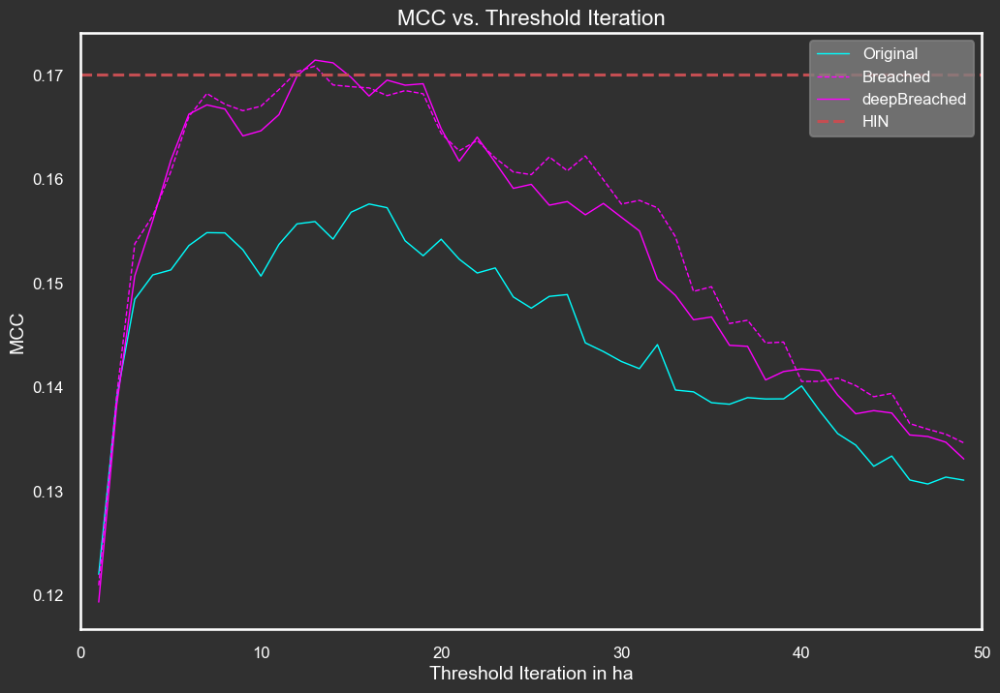

In [76]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming mccList and mccList_breached are already defined
mcc_df_filled_nat = pd.DataFrame(mccListFilled_nat, columns=['Iteration', 'MCC', 'name'])
mcc_df_breached_nat = pd.DataFrame(mccListBreached_nat, columns=['Iteration', 'MCC', 'name'])
mcc_df_deep_breached_nat = pd.DataFrame(mccListDeepBreached_nat, columns=['Iteration', 'MCC', 'name'])
# Set the Seaborn style to "dark"
sns.set(style="dark", context="talk")

# Create the figure and axis objects
fig, ax = plt.subplots(figsize=(12, 8))

# Customize the plot and axes backgrounds
fig.patch.set_facecolor('#303030')  # Set the figure background to dark
ax.set_facecolor('#303030')  # Set the axes background to dark

# Plot the data from the first DataFrame
sns.lineplot(data=mcc_df_filled_nat, x='Iteration', y='MCC', color="cyan", ax=ax, label='Original', linewidth=1.0, linestyle='-',errorbar=None)

# Plot the data from the second DataFrame
sns.lineplot(data=mcc_df_breached_nat, x='Iteration', y='MCC', color="magenta", ax=ax, label='Breached', linewidth=1.0, linestyle='--',errorbar=None)

# Plot the data from the second DataFrame
sns.lineplot(data=mcc_df_deep_breached_nat, x='Iteration', y='MCC', color="magenta", ax=ax, label='deepBreached', linewidth=1.0, linestyle='-',errorbar=None)
plt.axhline(y=0.17, color='r', linestyle='--', label='HIN')
# Set colors of plot elements for visibility in dark mode
plt.xlabel('Threshold Iteration in ha', color='white', fontsize=14)
plt.ylabel('MCC', color='white', fontsize=14)
plt.tick_params(axis='x', colors='white', labelsize=12)  # Change the color of the x-axis ticks
plt.tick_params(axis='y', colors='white', labelsize=12)  # Change the color of the y-axis ticks

# Set the title of the plot
plt.title('MCC vs. Threshold Iteration', color='white', fontsize=16)
plt.xlim(0,50)
#plt.ylim(0,0.3)
# Add legend with white text
legend = ax.legend(loc='upper right', fontsize=12, facecolor='gray', edgecolor='gray')
for text in legend.get_texts():
    text.set_color('white')

# Show the plot
plt.show()


## Save a dataframe with the max mcc for each region

In [39]:


# Group by 'name' and get the index of the row with the maximum MCC for each group
idx = mcc_df_breached.groupby('name')['MCC'].idxmax()

# Use these indices to create a new DataFrame
max_mcc_df = mcc_df_breached.loc[idx].reset_index(drop=True)
max_mcc_df['name'] = max_mcc_df['name'].str.replace('.shp', '', regex=False)
print(max_mcc_df)


     Iteration       MCC name
0            1  0.000000    0
1           14  0.377728    1
2           25  0.353185   10
3            6  0.228985  100
4            9  0.261368  101
..         ...       ...  ...
283         13  0.288193   95
284          9  0.462185   96
285         21 -0.000511   97
286         19  0.271057   98
287         24  0.000000   99

[288 rows x 3 columns]


In [54]:


# Assuming your DataFrame is named max_mcc_df
# Ensure the ID column names match, rename if necessary
max_mcc_df = max_mcc_df.rename(columns={'name': 'splitid'})

# Convert 'splitid' column in max_mcc_df to integer
max_mcc_df['splitid'] = max_mcc_df['splitid'].astype(int)

# Ensure the ID column in the shapefile (assuming it's called 'id') is also of type integer
gdf['splitid'] = gdf['splitid'].astype(int)

# Perform the join
merged_gdf = gdf.merge(max_mcc_df, left_on='splitid', right_on='splitid')

# Save the resulting GeoDataFrame to a new shapefile if needed
#output_path = 'U:/william/projects/culverts/data/hydrological_modeling/watersheds_SMHI/Result.gpkg'
merged_gdf = merged_gdf.drop(columns='geometry')
merged_df = pd.DataFrame(merged_gdf)
merged_df.to_csv('U:/william/projects/culverts/data/hydrological_modeling/watersheds_SMHI/Result.csv')



In [11]:
import os
from sklearn.metrics import matthews_corrcoef
import numpy as np
from multiprocessing.pool import ThreadPool
import geopandas as gpd

def calculate_mcc(flowaccPointDir, watershed):
    mccList = []
    if watershed.endswith('.shp'):
        pointFile = os.path.join(flowaccPointDir, watershed)
        gdf = gpd.read_file(pointFile)
        gdf['stream_initation_in_ha'] = gdf['VALUE'] / 10000
        gdf['isstream'] = np.where(gdf['Vattendrag'] == 3, 1, 0)

        for i in range(1, 50): # threshold range
            gdf['predstream'] = np.where(gdf['stream_initation_in_ha'] > i, 1, 0)
            mcc = matthews_corrcoef(gdf['isstream'], gdf['predstream'])
            mccList.append((i, mcc, str(watershed)))
    print('Finished ', watershed)
    return mccList

if __name__ == '__main__':
    flowaccPointDir = 'U:/william/projects/culverts/data/hydrological_modeling/flowaccumulation_Points_NILS/test'
    watershed_files = [file for file in os.listdir(flowaccPointDir) if file.endswith('.shp')]

    with ThreadPool(processes=os.cpu_count()) as pool:
        results = pool.starmap(calculate_mcc, [(flowaccPointDir, file) for file in watershed_files])

    # Flatten the list of lists
    mccList = [item for sublist in results for item in sublist]

    # Now mccList contains all the tuples calculated in parallel




Finished  134.shp
Finished  138.shp
Finished  132.shp
Finished  133.shp
Finished  1.shp
Finished  2.shp
Finished  130.shp
Finished  131.shp
Finished  136.shp
Finished  137.shp
Finished  135.shp
Finished  0.shp


## Optimal stream initation threshold

In [181]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data
optimal = pd.read_csv('U:/william/projects/culverts/data/hydrological_modeling/watersheds_SMHI/Result.csv')

#optimal['MCC'].mean()
optimal['MCC'].std()


0.26379576373999153

In [177]:
optimal

,Unnamed: 0,fid_1,ARO_UUID,MAINDOWN,NAME,LANGUAGE,HARO,BARONR,VAROID,DISTRICT,COUNTRY,AREA,AREA_UPSTR,VERSION_SV,splitid,Iteration,MCC
0,0,39.0,D3E5E442-B171-4233-A148-0E31D887F9DD,89DC4D3D-7491-49D7-9F9A-9A780FE0773B,N Lidöfjärden,swe,0,5700062,SE48835F36-194B-445D-9BAB-42CC019A8CF1,SE3,SE,24171200.0,2.417120e+07,2022_1_1,0,1,0.000000
1,1,113.0,5C0F0CB8-B330-4ACA-ABDD-2EFB303AB317,E5067951-1A2D-4D84-A2F4-F32BFDEF064E,Utloppet av Hällsjön,swe,61000,61001,SE38D4BB90-FC6A-4EDA-834E-9C2B1BF06B5E,SE3,SE,19070100.0,1.907010e+07,2022_1_1,1,14,0.377728
2,2,142.0,F11435C2-F78D-4048-99B2-4087637A880A,74B3F9FC-C6DC-4FFD-83F7-113A8D04D42B,Utloppet av Kornan,swe,59000,59001,SEF2A27890-3220-44F4-BA86-0E82516F570D,SE3,SE,8524800.0,8.524800e+06,2022_1_1,2,1,0.277003
3,3,147.0,FFB6A064-0A8B-401E-818C-F31FD578103E,05817009-6D10-4050-93FD-E59991493A9C,Utloppet av Bjursjön,swe,61000,61003,SE83BE8794-C356-4568-B7EA-96C014F46547,SE3,SE,6221700.0,6.221700e+06,2022_1_1,3,3,0.143132
4,4,242.0,EC38F46D-1879-4BAB-955B-0B6886DBAA36,28391BAB-B198-427E-954E-53652C2F688C,Utloppet av Norra Yngern,swe,61000,61010,SE17B1C7E9-6998-4ABA-A4C2-DB9EE5EDFBAE,SE3,SE,60822000.0,6.082200e+07,2022_1_1,4,1,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,283,25122.0,DE6B2132-3D6F-4B90-AD78-67F00EA81FA3,E437AA03-B225-4B35-934E-2733AF407669,Utloppet av Aspen,(1:swe),108000,108022,SE467ACD04-FD76-467F-8918-37CE2C2B38EF,SE5_INT,SE,26912400.0,1.398440e+09,2022_1_1,283,8,0.266731
284,284,25125.0,BB7DEB56-9141-43A8-8F6A-C7D6C79E2D12,472D8497-2D66-4E2B-BA30-0DDBD3FCAA79,Lagan,(1:swe),98000,98004,SE648FD46B-28C7-43A3-9439-2769A9E61756,SE5_INT,SE,19776300.0,1.414415e+09,2022_1_1,284,43,0.577230
285,285,25183.0,1F5A0DE3-677F-4F31-97AD-85BFFED7E9CF,7D39576C-DC7D-453C-B0B1-BD1A137ECC6A,Vänern,(1:swe),108000,108017,SE76909C59-674C-4F00-85EC-2D3A85B354DA,SE5_INT,SE,171619000.0,2.425032e+09,2022_1_1,285,6,0.577230
286,286,25311.0,C631C833-E3C0-4793-AC8E-92072046A900,CE90B101-DC83-46B9-9647-10474049961A,Göta älv,(1:swe),108000,108009,SE996BE6A7-EFD1-43AF-800A-55FF66A469DC,SE5_INT,SE,52059900.0,4.704280e+10,2022_1_1,286,1,0.431383


# Gävle trummor